In [1]:
import matplotlib.pyplot as plt 
import pandas as pd
import numpy as np
import os
import zipfile
import geopandas as gpd
import sklearn.cluster
from sklearn import mixture
from scipy.cluster.vq import kmeans2
%pylab inline 
kelly_colors_hex = [
    #'#FFB300', # Vivid Yellow
    '#803E75', # Strong Purple
    '#FF6800', # Vivid Orange
    #'#A6BDD7', # Very Light Blue
    '#C10020', # Vivid Red
    '#CEA262', # Grayish Yellow
    '#817066', # Medium Gray
    '#007D34', # Vivid Green
    '#F6768E', # Strong Purplish Pink
    '#00538A', # Strong Blue
    '#FF7A5C', # Strong Yellowish Pink
    '#53377A', # Strong Violet
    '#FF8E00', # Vivid Orange Yellow
    '#B32851', # Strong Purplish Red
    '#F4C800', # Vivid Greenish Yellow
    '#7F180D', # Strong Reddish Brown
    '#93AA00', # Vivid Yellowish Green
    '#593315', # Deep Yellowish Brown
    '#F13A13', # Vivid Reddish Orange
    '#232C16', # Dark Olive Green
    '#FFB300', # Vivid Yellow
    '#803E75', # Strong Purple
    '#FF6800', # Vivid Orange
    '#A6BDD7', # Very Light Blue
    '#C10020', # Vivid Red
    '#CEA262', # Grayish Yellow
    '#817066', # Medium Gray
    '#007D34', # Vivid Green
    '#F6768E', # Strong Purplish Pink
    '#00538A', # Strong Blue
    '#FF7A5C', # Strong Yellowish Pink
    '#53377A', # Strong Violet
    '#FF8E00', # Vivid Orange Yellow
    '#B32851', # Strong Purplish Red
    '#F4C800', # Vivid Greenish Yellow
    '#7F180D', # Strong Reddish Brown
    '#93AA00', # Vivid Yellowish Green
    '#593315', # Deep Yellowish Brown
    '#F13A13', # Vivid Reddish Orange
    '#232C16', # Dark Olive Green
    '#FFB300', # Vivid Yellow
    '#803E75', # Strong Purple
    '#FF6800', # Vivid Orange
    '#A6BDD7', # Very Light Blue
    '#C10020', # Vivid Red
    '#CEA262', # Grayish Yellow
    '#817066', # Medium Gray
    '#007D34', # Vivid Green
    '#F6768E', # Strong Purplish Pink
    '#00538A', # Strong Blue
    '#FF7A5C', # Strong Yellowish Pink
    '#53377A', # Strong Violet
    '#FF8E00', # Vivid Orange Yellow
    '#B32851', # Strong Purplish Red
    '#F4C800', # Vivid Greenish Yellow
    '#7F180D', # Strong Reddish Brown
    '#93AA00', # Vivid Yellowish Green
    '#593315', # Deep Yellowish Brown
    '#F13A13', # Vivid Reddish Orange
    '#232C16', # Dark Olive Green
    '#FFB300', # Vivid Yellow
    '#803E75', # Strong Purple
    '#FF6800', # Vivid Orange
    '#A6BDD7', # Very Light Blue
    '#C10020', # Vivid Red
    '#CEA262', # Grayish Yellow
    '#817066', # Medium Gray
    '#007D34', # Vivid Green
    '#F6768E', # Strong Purplish Pink
    '#00538A', # Strong Blue
    '#FF7A5C', # Strong Yellowish Pink
    '#53377A', # Strong Violet
    '#FF8E00', # Vivid Orange Yellow
    '#B32851', # Strong Purplish Red
    '#F4C800', # Vivid Greenish Yellow
    '#7F180D', # Strong Reddish Brown
    '#93AA00', # Vivid Yellowish Green
    '#593315', # Deep Yellowish Brown
    '#F13A13', # Vivid Reddish Orange
    '#232C16', # Dark Olive Green
    '#FFB300', # Vivid Yellow
    '#803E75', # Strong Purple
    '#FF6800', # Vivid Orange
    '#A6BDD7', # Very Light Blue
    '#C10020', # Vivid Red
    '#CEA262', # Grayish Yellow
    '#817066', # Medium Gray
    '#007D34', # Vivid Green
    '#F6768E', # Strong Purplish Pink
    '#00538A', # Strong Blue
    '#FF7A5C', # Strong Yellowish Pink
    '#53377A', # Strong Violet
    '#FF8E00', # Vivid Orange Yellow
    '#B32851', # Strong Purplish Red
    '#F4C800', # Vivid Greenish Yellow
    '#7F180D', # Strong Reddish Brown
    '#93AA00', # Vivid Yellowish Green
    '#593315', # Deep Yellowish Brown
    '#F13A13', # Vivid Reddish Orange
    '#232C16', # Dark Olive Green
    '#FFB300', # Vivid Yellow
    '#803E75', # Strong Purple
    '#FF6800', # Vivid Orange
    '#A6BDD7', # Very Light Blue
    '#C10020', # Vivid Red
    '#CEA262', # Grayish Yellow
    '#817066', # Medium Gray
    '#007D34', # Vivid Green
    '#F6768E', # Strong Purplish Pink
    '#00538A', # Strong Blue
    '#FF7A5C', # Strong Yellowish Pink
    '#53377A', # Strong Violet
    '#FF8E00', # Vivid Orange Yellow
    '#B32851', # Strong Purplish Red
    '#F4C800', # Vivid Greenish Yellow
    '#7F180D', # Strong Reddish Brown
    '#93AA00', # Vivid Yellowish Green
    '#593315', # Deep Yellowish Brown
    '#F13A13', # Vivid Reddish Orange
    '#232C16', # Dark Olive Green
 ]

Populating the interactive namespace from numpy and matplotlib


#1. get and prep your data.

In [2]:
FileNames=[]
dfNames=[]
for i in range(94,100):
    name='zbp%02dtotals.zip'%i
    FileNames.append(name)
    FrameName='%02d'%i
    dfNames.append(FrameName)
for i in range(0,14):
    name='zbp%02dtotals.zip'%i
    FileNames.append(name)
    FrameName='%02d'%i
    dfNames.append(FrameName)
#dfNames

In [3]:
j=0
dic={}
for fname in FileNames:
    zf = zipfile.ZipFile('data/'+fname)
    framename=dfNames[j]
    dic[framename] = pd.read_csv(zf.open(fname.replace('.zip','.txt')))
    j+=1
    #print fname

In [4]:
data_geo = gpd.read_file('data/nyc-zip-code-tabulation-areas-polygons.geojson')   ##include geojson file

In [5]:
#Will put the name "zip" to all the zips columns
for key in dic.keys():
    if dic[key].columns[0]!='zip':
        dic[key].rename(columns={dic[key].columns[0]: 'zip'}, inplace=True)
    if dic[key].columns[6]=='EST':
        dic[key].rename(columns={'EST': 'est'}, inplace=True)
    #print key, df[key].columns[0]=='zip'
data_geo['zip']=data_geo['postalCode'].astype(int)
#rename(columns={'postalCode': 'zip'}, inplace=True)

In [6]:
NYC={}
for key in dic.keys():
    NYC[key]=pd.merge(dic[key],data_geo, on=['zip'],how='inner')
    #NYC[key].reset_index(level=0, inplace=True)
    #NYC[key] = NYC[key].set_index('zip')
    #NYC[key].index.name = None
    NYC[key]=NYC[key][['zip','est']]
    st='est_'+key
    NYC[key].rename(columns={'est': st}, inplace=True)
    NYC[key].drop_duplicates('zip',inplace=True)
    #print key, len(NYC[key])

In [7]:
import functools

In [8]:
merge = functools.partial(pd.merge, how='inner',on=['zip'])
test1 = functools.reduce(merge, NYC.values())
shape(test1)

(230, 21)

In [9]:
test1.reset_index(level=0, inplace=True)
test1 = test1.set_index('zip')
test1.index.name = None
test1.drop('index', axis=1, inplace=True)
test1.head()

,est_02,est_03,est_00,est_01,est_06,est_07,est_04,est_05,est_08,est_09,est_13,est_99,est_98,est_12,est_11,est_96,est_95,est_94,est_97,est_10
10001,7141,7084,7317,7188,7415,7549,7370,7312,7472,7305,7273,7233,7254,7235,7227,7075,7088,6999,7154,7241
10002,2269,2402,2277,2543,2686,2685,2551,2682,2691,2775,2988,2085,2003,2954,2912,1919,1819,1784,2049,2872
10003,3616,3704,3683,3602,3909,4049,3776,3867,4071,4099,4277,3659,3649,4214,4159,3417,3377,3256,3535,4113
10004,1253,1252,1294,1247,1311,1370,1283,1260,1376,1379,1479,1233,1176,1442,1404,1133,1124,1115,1173,1398
10005,1244,1200,1287,1249,1259,1273,1226,1214,1291,1274,1296,1242,1270,1273,1301,1216,1109,1076,1227,1266


In [10]:
mydata=test1
for z in test1.index:
    m=mean(test1.loc[z])
    st=std(test1.loc[z])
    mydata.loc[z]=(mydata.loc[z]-m)/st
a=list(mydata.columns)    #put the columns in chronological order
b=sorted(a)[14:20]+sorted(a)[0:14]
mydata=mydata[b]
mydata.head()

,est_94,est_95,est_96,est_97,est_98,est_99,est_00,est_01,est_02,est_03,est_04,est_05,est_06,est_07,est_08,est_09,est_10,est_11,est_12,est_13
10001,-1.831632,-1.173250,-1.269418,-0.685012,0.054742,-0.100607,0.520787,-0.433496,-0.781180,-1.202840,0.912857,0.483799,1.245746,2.237017,1.667406,0.432016,-0.041426,-0.144992,-0.085811,0.195295
10002,-1.722813,-1.631907,-1.372173,-1.034519,-1.153997,-0.941015,-0.442326,0.248565,-0.463105,-0.117659,0.269344,0.609595,0.619984,0.617387,0.632971,0.851147,1.103089,1.206982,1.316071,1.404380
10003,-1.872528,-1.457250,-1.319968,-0.914985,-0.523731,-0.489411,-0.407041,-0.685038,-0.636989,-0.334968,-0.087861,0.224456,0.368602,0.849090,0.924595,1.020693,1.068741,1.226616,1.415379,1.631598
10004,-1.608897,-1.523770,-1.438643,-1.060302,-1.031926,-0.492790,0.084181,-0.360370,-0.303619,-0.313078,-0.019863,-0.237409,0.244976,0.803030,0.859781,0.888157,1.067869,1.124620,1.484044,1.834010
10005,-2.885957,-2.304004,-0.417066,-0.223082,0.535220,0.041442,0.835014,0.164887,0.076712,-0.699225,-0.240717,-0.452336,0.341236,0.588125,0.905554,0.605760,0.464681,1.081903,0.588125,0.993729


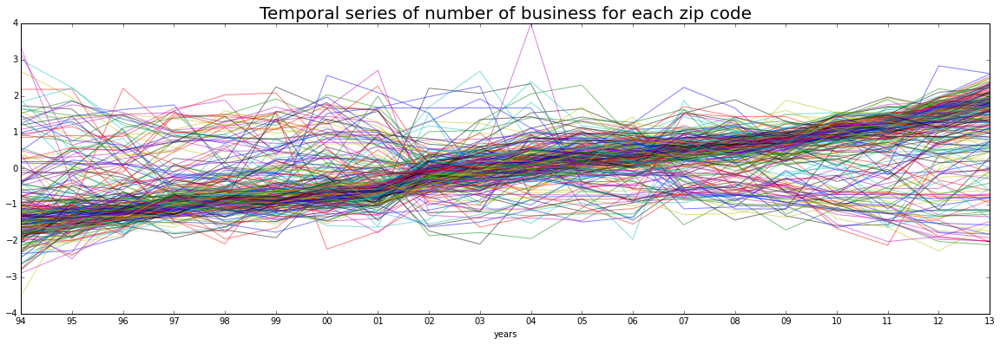

In [11]:
years=range(1994,2014)
fig=plt.figure(figsize = (20,6))
ax = fig.add_subplot(111)
plt.xticks(years, dfNames)
for zipc in mydata.index:
    tempSe=mydata.loc[zipc]
    plt.plot(years, tempSe, alpha=0.5)
plt.xlabel('years')
ax.set_title("Temporal series of number of business for each zip code", fontsize=20)
plt.show()    

Figure 1: temporal series of number of business for each zip code. The x axis represents the year (from 94 to 2013) while the y axis represents the number of new business

#2. cluster the NUMBER OF ESTABLISHMENTS time series with K-means in **a few** clusters

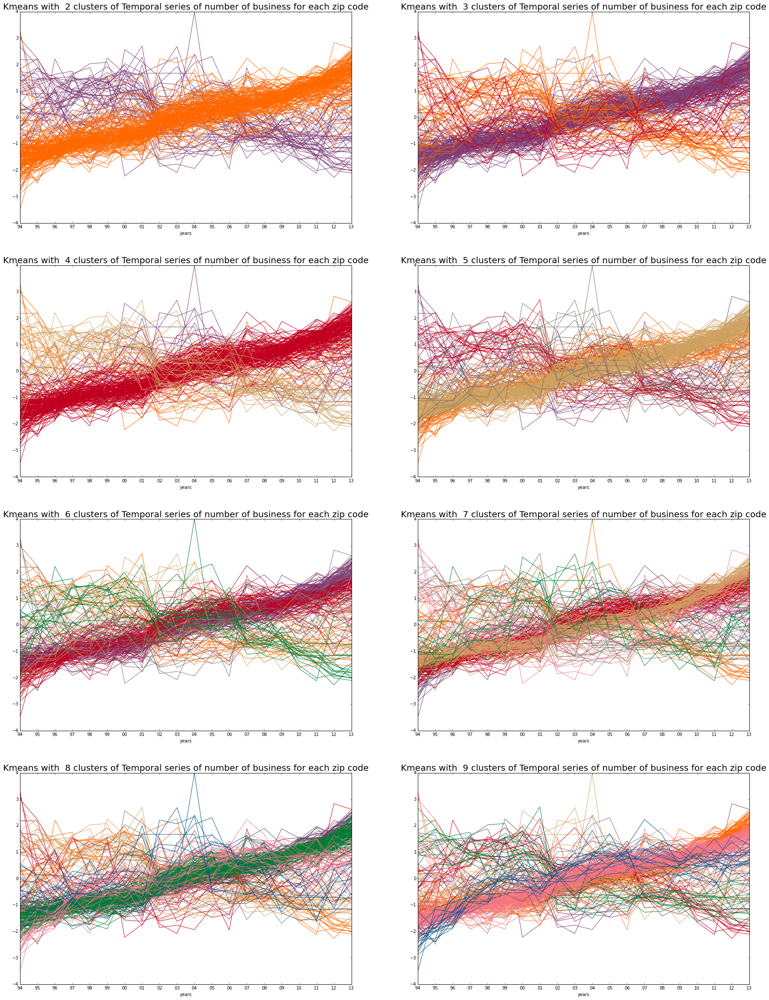

In [12]:
fig=plt.figure(figsize = (30,40))
for n_c in range(2,10):
    clf = sklearn.cluster.KMeans(n_clusters=n_c)
    labels = clf.fit_predict(mydata)
    pos=n_c-1
    ax = fig.add_subplot(4,2,pos)
    plt.xticks(years, dfNames)
    for l in np.unique(labels):
        cluster=mydata[labels==l]
        for zipc in cluster.index:
            tempSe=mydata.loc[zipc]
            plt.plot(years, tempSe, alpha=1,color= kelly_colors_hex[l])
    plt.xlabel('years')
    title="Kmeans with %2d clusters of Temporal series of number of business for each zip code"%n_c
    ax.set_title(title, fontsize=20)           

Figure 2. Clustering the time series of the number of new business by zipcode using Kmeans with number of clusters equal to 2,3,4,...,9

#3. plot the cluster centers 

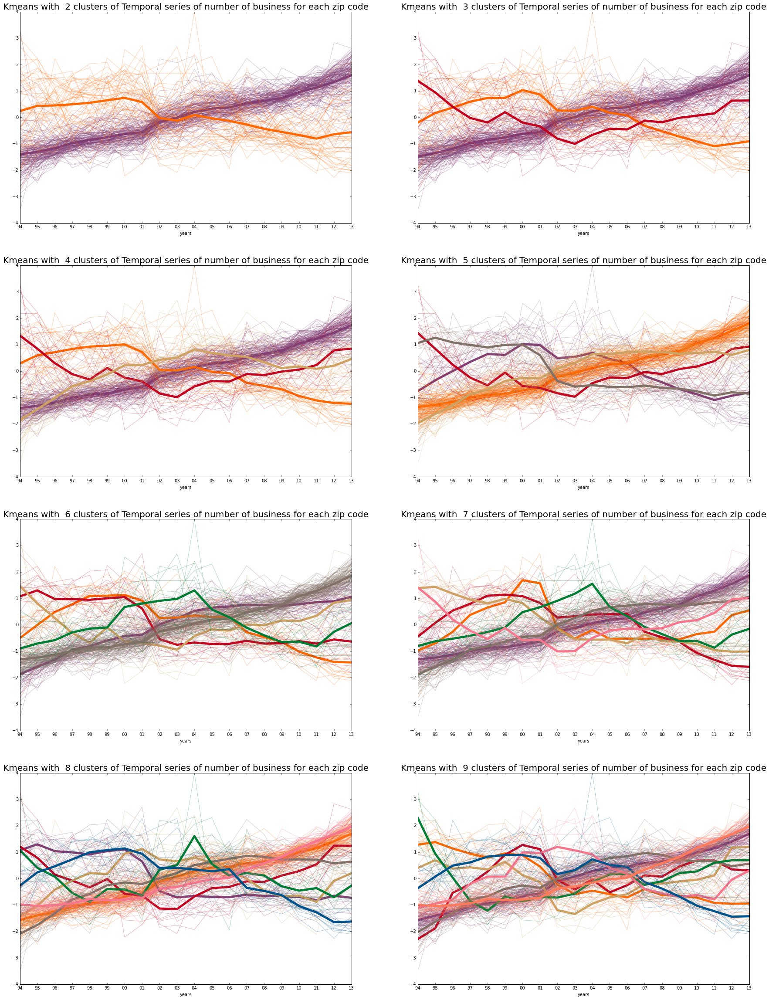

In [14]:
mydata_clustered=pd.DataFrame(columns=['zip'])
mydata_clustered['zip']=mydata.index
fig=plt.figure(figsize = (30,40))
for n_c in range(2,10):
    clf = sklearn.cluster.KMeans(n_clusters=n_c)
    labels = clf.fit_predict(mydata)
    col_name="cluster_%1d"%n_c
    mydata_clustered[col_name]=labels
    pos=n_c-1
    ax = fig.add_subplot(4,2,pos)
    plt.xticks(years, dfNames)
    for l in np.unique(labels):
        cluster=mydata[labels==l]
        me=mean(cluster)
        for zipc in cluster.index:
            tempSe=mydata.loc[zipc]
            plt.plot(years, tempSe, alpha=0.3,color= kelly_colors_hex[l])
        plt.plot(years, me, alpha=1,color= kelly_colors_hex[l],linewidth=5.0)
    plt.xlabel('years')
    title="Kmeans with %2d clusters of Temporal series of number of business for each zip code"%n_c
    ax.set_title(title, fontsize=20)

Figure 3. Clustering the time series of the number of new business by zipcode using Kmeans with number of clusters equal to 2,3,4,...,9 and the clusters' means

#4. Use another clustering algorithm 

From http://scikit-learn.org/stable/modules/clustering.html I will use Spectral clustering

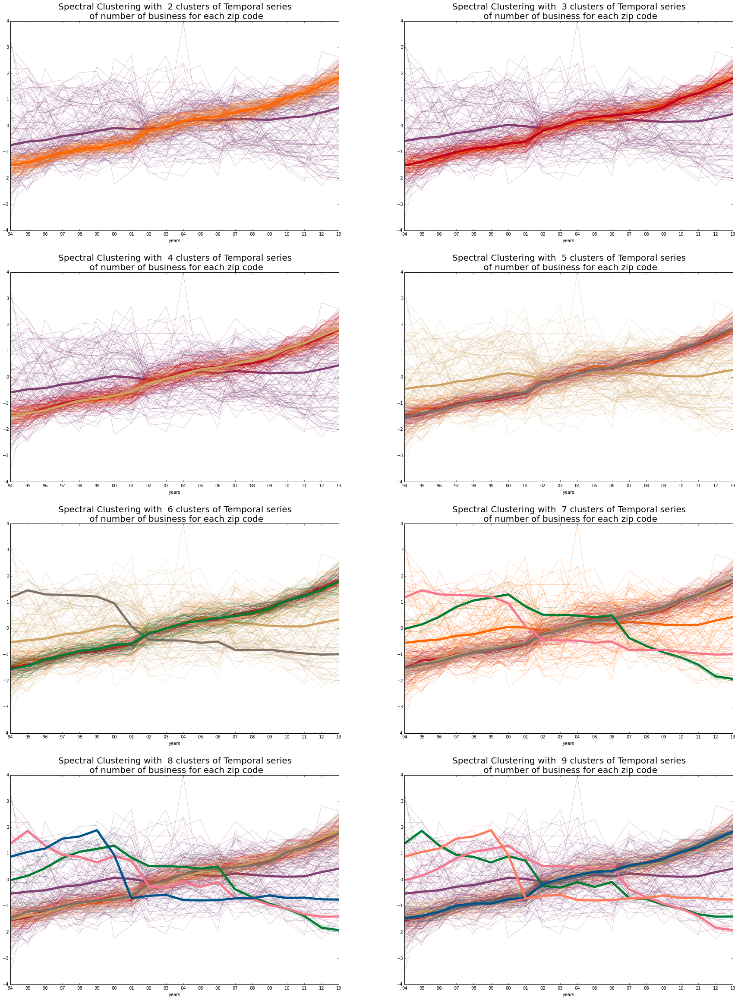

In [15]:
mydata_clustered2=pd.DataFrame(columns=['zip'])
mydata_clustered2['zip']=mydata.index
fig=plt.figure(figsize = (30,40))
for n_c in range(2,10):
    clf = sklearn.cluster.SpectralClustering(n_clusters=n_c)
    labels = clf.fit_predict(mydata)
    col_name="cluster_%1d"%n_c
    mydata_clustered2[col_name]=labels
    pos=n_c-1
    ax = fig.add_subplot(4,2,pos)
    plt.xticks(years, dfNames)
    for l in np.unique(labels):
        cluster=mydata[labels==l]
        me=mean(cluster)
        for zipc in cluster.index:
            tempSe=mydata.loc[zipc]
            plt.plot(years, tempSe, alpha=0.3,color= kelly_colors_hex[l])
        plt.plot(years, me, alpha=1,color= kelly_colors_hex[l],linewidth=5.0)
    plt.xlabel('years')
    title="Spectral Clustering with %2d clusters of Temporal series \n of number of business for each zip code"%n_c
    ax.set_title(title, fontsize=20)

Figure 4. Clustering the time series of the number of new business by zipcode using Spectral Clustering with number of clusters equal to 2,3,4,...,9 and the clusters' means

#5. overlay your data on a NYC map:

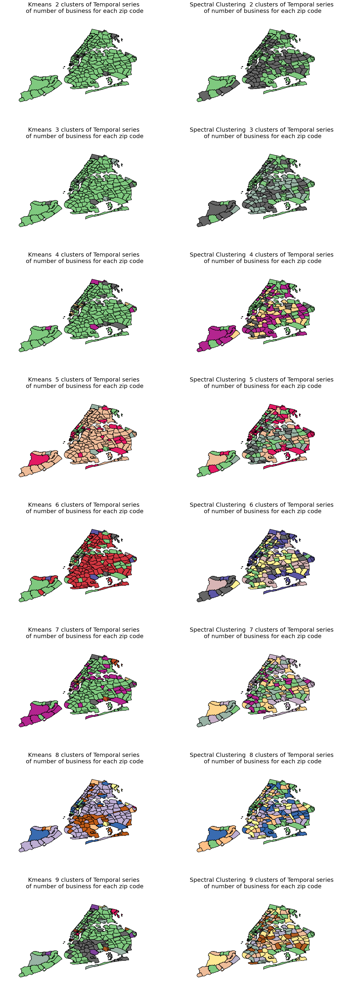

In [16]:
fig = plt.figure(figsize= (20,60))
for n_c in range(2,10):
    col_name="cluster_%1d"%n_c
    pos=n_c-1
    ax = fig.add_subplot(8,2,(2*pos)-1)
    #plt.xticks(years, dfNames)
    merged=pd.merge(data_geo,mydata_clustered,on=['zip'],how='left')
    merged.plot(column=col_name,axes=ax, alpha=1, colormap='Accent')
    plt.axis('off')
    title="Kmeans %2d clusters of Temporal series \n of number of business for each zip code"%n_c
    plt.title(title, fontsize=20)
    ax = fig.add_subplot(8,2,(2*pos))
    #plt.xticks(years, dfNames)
    merged2=pd.merge(data_geo,mydata_clustered2,on=['zip'],how='left')
    merged2.plot(column=col_name,axes=ax, alpha=1, colormap='Accent')
    plt.axis('off')
    title="Spectral Clustering %2d clusters of Temporal series \n of number of business for each zip code"%n_c
    plt.title(title, fontsize=20)
    

Figure 5. Clustering the time series of the number of new business by zipcode using Kmeans (left) and Spectral Clustering (right) with number of clusters equal to 2,3,4,...,9 overlayed in a New York City map divided by zipcode

# 6.Compare the results of the 2 algorithms

In [17]:
compar=pd.merge(mydata_clustered,mydata_clustered2,on=['zip'],suffixes=('_k', '_s'))

In [18]:
difference=pd.DataFrame(columns=['number_of_clusters','difference','rate'])
difference['number_of_clusters']=range(2,10)
for n in range(2,10):
    col_namek="cluster_%1d_k"%n
    col_names="cluster_%1d_s"%n
    i=0
    for z in compar.index:
        if compar.loc[z,col_namek]!=compar.loc[z,col_names]:
            i=i+1
    difference.loc[n-2,'difference']=i
    difference.loc[n-2,'rate']=float(i)/float(len(compar))
difference

,number_of_clusters,difference,rate
0,2,137,0.5956522
1,3,167,0.726087
2,4,188,0.8173913
3,5,181,0.7869565
4,6,216,0.9391304
5,7,190,0.826087
6,8,187,0.8130435
7,9,219,0.9521739


For compare the two algorithms I counted the number of zip codes that are in different regions between the kmeans and the Spectral Clustering algorithm.

# 7 attempt an interpretation.

For every number of clusters, it seems like there is a general grow tendency that in figures 3 and 4 can be visualized as a thick set of lines growing on the same trend in the middle of the graphic. With the Kmeans algorithm is more evident, by looking at figure 5, that the most parts of the city follow this trend (look at the light green areas for the map for 2,3,4,5 clusters) while there are just few areas in the city (midtown and JFK, around others) that seems to follow a different time series than the rest of the city.